<a href="https://colab.research.google.com/github/xueyil9/baseflow_pypi/blob/master/4_GSLB_merge_plot.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 1.Load ML model BFD results

In [9]:
import pandas as pd
import geopandas as gpd
import glob
import os
import time

def load_streamflow_data(data_folder):
    """
    Load all CSV files from the specified folder, parsing 'Date' column as datetime
    If 'Date' column is not found, it prints a warning and skips parsing dates.

    Parameters:
    data_folder: Path to the folder containing streamflow CSV files

    Returns:
    Dictionary: Keys are file names (without .csv), values are DataFrames
    """
    streamflow_data = {}
    csv_files = glob.glob(os.path.join(data_folder, '*.csv'))

    for file_path in csv_files:
        file_name = os.path.splitext(os.path.basename(file_path))[0]
        try:
            # Try parsing 'Date' column as datetime
            df = pd.read_csv(file_path, parse_dates=['Date'])
        except ValueError as e:
            if "Missing column provided to 'parse_dates'" in str(e):
                # If 'Date' column is missing, print a warning and load without date parsing
                print(f"Warning: 'Date' column not found in {file_name}.csv. Skipping date parsing.")
                df = pd.read_csv(file_path)
            else:
                # Re-raise other ValueErrors
                raise e
        streamflow_data[file_name] = df

    print(f"Loaded {len(streamflow_data)} CSV files: {list(streamflow_data.keys())}")
    return streamflow_data

In [7]:
from google.colab import drive
drive.mount('/content/drive')
data_folder = '/content/drive/MyDrive/xueyi_research/GSLB_ML/'


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [10]:
streamflow_data = load_streamflow_data(data_folder)


Loaded 70 CSV files: ['10157500', '10015900', '10134500', '10026500', '10041000', '10141000', '10092700', '10106000', '10159500', '10047500', '10105900', '10118000', '10132000', '10136500', '10128500', '10028500', '10155500', '10079500', '10129900', '10133650', '10171000', '10167000', '10155000', '10155200', '10143500', '10132500', '10153100', '10163000', '10038000', '10020100', '10104700', '10020300', '10133800', '10172860', '10130500', '10126000', '10168000', '10011500', '10152000', '10023000', '10039500', '10131000', '10133600', '10113500', '10109000', '10129300', '10172700', '10139300', '10125500', '10016900', '10109001', '10104900', '10142000', '10046500', '10102250', '10154200', '10137500', '10172952', '10129500', '10150500', '10146000', '10156000', '10153800', '10164500', '10140100', '10068500', '10015700', '10058600', '10146400', '10168500']


In [11]:
type(streamflow_data) # To check the type of the streamflow_data variable itself


dict

# 2.Create pairs

In [13]:
result_df = pd.read_csv('/content/filtered_gage_well_relationships.csv')
result_df['Date'] = pd.to_datetime(result_df['date'])  # Convert 'Date' to datetime

In [25]:
def read_gage_classification(excel_path):
    """
    Read GAGESII classification data

    Args:
        excel_path (str): Path to GAGESII classification Excel file

    Returns:
        dict: Dictionary mapping gage IDs to their classification (Ref/Non-ref)
    """
    gage_class_df = pd.read_excel(excel_path)
    # Ensure STAID column is string type for consistent matching
    gage_class_df['STAID'] = gage_class_df['STAID'].astype(str)
    return dict(zip(gage_class_df['STAID'], gage_class_df['CLASS']))

def find_pairs(streamflow_data, final_measurements_delta, gage_classification, output_dir='output', float_precision=3):
    """
    Find pairs of well data and streamflow data, including gage classification

    Args:
        streamflow_data (dict): Dictionary of streamflow DataFrames
        final_measurements_delta (pd.DataFrame): DataFrame containing well data
        gage_classification (dict): Dictionary mapping gage IDs to their classification
        output_dir (str): Directory to store output files
        float_precision (int): Decimal places for float values

    Returns:
        tuple: (created_files, classification_report)
            - created_files: List of created CSV filenames
            - classification_report: Dictionary containing classification results
    """
    os.makedirs(output_dir, exist_ok=True)
    created_files = []

    # Track classification results
    classification_report = {
        'classified_gages': [],
        'unclassified_gages': [],
        'ref_gages': [],
        'non_ref_gages': []
    }

    for gage_id, streamflow_df in streamflow_data.items():
        print(f"Working on Gage {gage_id}")
        start = time.time()

        # Check if gage has classification
        gage_class = gage_classification.get(str(gage_id), 'Unknown')
        if gage_class == 'Unknown':
            classification_report['unclassified_gages'].append(gage_id)
        else:
            classification_report['classified_gages'].append(gage_id)
            if gage_class == 'Ref':
                classification_report['ref_gages'].append(gage_id)
            else:
                classification_report['non_ref_gages'].append(gage_id)

        # Filter streamflow data for baseflow conditions
        filtered_streamflow = streamflow_df[streamflow_df['ML_BFD'] == 1][['date', 'Q']]
        print(f"Filtered Streamflow Data Shape: {filtered_streamflow.shape}")
        filtered_streamflow = streamflow_df[streamflow_df['ML_BFD'] == 1][['date', 'Q']]
        # Convert 'date' to datetime in filtered_streamflow
        filtered_streamflow['date'] = pd.to_datetime(filtered_streamflow['date'])

        # Add gage information
        filtered_streamflow['gage_id'] = gage_id
        filtered_streamflow['gage_class'] = gage_class

        # Ensure date format consistency
        final_measurements_delta['date'] = pd.to_datetime(final_measurements_delta['date'])

        # Merge streamflow and well data
        paired = filtered_streamflow.merge(
            final_measurements_delta[['well_id', 'date', 'delta_wte', 'wte']],
            on='date',
            how='inner'
        )

        # Reorder columns
        paired = paired[['gage_id', 'gage_class'] +
                       [col for col in paired.columns if col not in ['gage_id', 'gage_class']]]

        # Adjust float precision
        float_columns = paired.select_dtypes(include=['float64', 'float32']).columns
        for col in float_columns:
            paired[col] = paired[col].round(float_precision).astype('float32')

        # Save non-empty pairs
        if not paired.empty:
            output_file = os.path.join(output_dir, f'paired_gage_{gage_id}.csv')
            paired.to_csv(output_file, index=False)
            created_files.append(output_file)

        # Clean up memory
        del filtered_streamflow
        del paired

        print(f"Finished Gage {gage_id} with {(time.time() - start):.1f} seconds")

    # Print classification summary
    print("\nClassification Summary:")
    print(f"Total gages processed: {len(streamflow_data)}")
    print(f"Classified gages: {len(classification_report['classified_gages'])}")
    print(f"Unclassified gages: {len(classification_report['unclassified_gages'])}")
    print(f"Reference gages: {len(classification_report['ref_gages'])}")
    print(f"Non-reference gages: {len(classification_report['non_ref_gages'])}")

    if classification_report['unclassified_gages']:
        print("\nUnclassified gage IDs:")
        print(classification_report['unclassified_gages'])

    return created_files, classification_report

In [26]:
gage_classification = read_gage_classification('/content/GAGES-II_ref_non_ref.xlsx')

created_files = find_pairs(
    streamflow_data=streamflow_data,
    final_measurements_delta=result_df,
    gage_classification=gage_classification,
    output_dir='paired_data',
    float_precision=3
)

Working on Gage 10157500
Filtered Streamflow Data Shape: (9424, 2)
Finished Gage 10157500 with 0.7 seconds
Working on Gage 10015900
Filtered Streamflow Data Shape: (6805, 2)
Finished Gage 10015900 with 1.1 seconds
Working on Gage 10134500
Filtered Streamflow Data Shape: (25836, 2)
Finished Gage 10134500 with 2.8 seconds
Working on Gage 10026500
Filtered Streamflow Data Shape: (13208, 2)
Finished Gage 10026500 with 2.8 seconds
Working on Gage 10041000
Filtered Streamflow Data Shape: (5763, 2)
Finished Gage 10041000 with 1.4 seconds
Working on Gage 10141000
Filtered Streamflow Data Shape: (14963, 2)
Finished Gage 10141000 with 1.3 seconds
Working on Gage 10092700
Filtered Streamflow Data Shape: (6422, 2)
Finished Gage 10092700 with 0.9 seconds
Working on Gage 10106000
Filtered Streamflow Data Shape: (12474, 2)
Finished Gage 10106000 with 1.0 seconds
Working on Gage 10159500
Filtered Streamflow Data Shape: (7082, 2)
Finished Gage 10159500 with 1.2 seconds
Working on Gage 10047500
Filtered

In [27]:
import os

# Assuming 'paired_data' directory is in the current working directory
paired_data_dir = '/content/paired_data/'

# Count the number of files in the directory
num_files = 0
if os.path.exists(paired_data_dir) and os.path.isdir(paired_data_dir):
    num_files = len([f for f in os.listdir(paired_data_dir) if os.path.isfile(os.path.join(paired_data_dir, f))])
    print(f"There are {num_files} files in the 'paired_data' directory.")
else:
    print("'paired_data' directory not found.")

There are 70 files in the 'paired_data' directory.


# 3.Plot

In [30]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
from sklearn.linear_model import LinearRegression
def analyze_single_gage(file_path, remove_outliers=True):
    """
    Analyze Q-WTE relationship for a single gage with different colors for each well
    """
    # Read data
    df = pd.read_csv(file_path)
    gage_id = df['gage_id'].iloc[0]
    gage_class = df['gage_class'].iloc[0]

    # Get initial well count
    unique_wells = df['well_id'].unique()
    n_wells = len(unique_wells)

    # Create color map for wells
    well_colors = plt.cm.tab20(np.linspace(0, 1, n_wells))  # Use tab20 colormap for distinct colors
    well_color_dict = dict(zip(unique_wells, well_colors))

    # Outlier removal process
    if remove_outliers:
        # For Q
        Q1_q = df['Q'].quantile(0.25)
        Q3_q = df['Q'].quantile(0.75)
        IQR_q = Q3_q - Q1_q
        q_outlier_mask = (df['Q'] < Q1_q - 3*IQR_q) | (df['Q'] > Q3_q + 3*IQR_q)

        # For Delta_WTE
        Q1_w = df['delta_wte'].quantile(0.25)
        Q3_w = df['delta_wte'].quantile(0.75)
        IQR_w = Q3_w - Q1_w
        wte_outlier_mask = (df['delta_wte'] < Q1_w - 3*IQR_w) | (df['delta_wte'] > Q3_w + 3*IQR_w)

        # Remove outliers
        df_clean = df[~(q_outlier_mask | wte_outlier_mask)]

        outlier_stats = {
            'Q_outliers': sum(q_outlier_mask),
            'WTE_outliers': sum(wte_outlier_mask),
            'total_outliers': sum(q_outlier_mask | wte_outlier_mask)
        }
    else:
        df_clean = df
        outlier_stats = {'Q_outliers': 0, 'WTE_outliers': 0, 'total_outliers': 0}

    # Calculate regression statistics
    # Filter out zero and negative values before log transformation
    df_clean = df_clean[df_clean['Q'] > 0]  # Add this line

    # Skip if no valid data after filtering
    if len(df_clean) == 0:
        print(f"Skipping {gage_id} - no valid Q values for log transformation")
        return

    X = np.log10(df_clean['Q']).values.reshape(-1, 1)
    y = df_clean['delta_wte'].values
    X = np.log10(df_clean['Q']).values.reshape(-1, 1)
    y = df_clean['delta_wte'].values
    model = LinearRegression()
    model.fit(X, y)
    r_squared = model.score(X, y)
    slope = model.coef_[0]

    # Calculate p-value
    n = len(df_clean)
    mse = np.sum((y - model.predict(X))**2) / (n-2)
    var_b = mse / (np.sum((X - X.mean())**2))
    sd_b = np.sqrt(var_b)
    t_stat = slope / sd_b
    p_value = 2 * (1 - stats.t.cdf(abs(t_stat), n-2))

    # Create visualization
    fig, axes = plt.subplots(1, 2, figsize=(15, 5))

    # Q vs Delta_WTE scatter plot with different colors for each well
    for well_id in unique_wells:
        well_data = df_clean[df_clean['well_id'] == well_id]
        axes[0].scatter(well_data['Q'], well_data['delta_wte'],
                       color=well_color_dict[well_id],
                       alpha=0.5,
                       label=f'Well {well_id}')

    # Add regression line
    Q_range = np.logspace(np.log10(df_clean['Q'].min()), np.log10(df_clean['Q'].max()), 100)
    X_pred = np.log10(Q_range).reshape(-1, 1)
    y_pred = model.predict(X_pred)
    axes[0].plot(Q_range, y_pred, 'k-', label='Regression line', linewidth=2)

    axes[0].set_xscale('log')
    axes[0].set_xlabel('Q (log scale)')
    axes[0].set_ylabel('Delta WTE')

    # Add statistics text
    axes[0].set_title(f'Gage {gage_id} ({gage_class})')
    # Remove gage info from stats text
    stats_text = (f'Wells: {n_wells}\n'
                 f'Measurements: {len(df_clean)}\n'
                 f'R²: {r_squared:.3f}\n'
                 f'Slope: {slope:.3f}\n'
                 f'p-value: {p_value:.2e}')
    axes[0].text(0.05, 0.95, stats_text, transform=axes[0].transAxes,
                verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

    # Add legend
    axes[0].legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

    # Time series plot
    df_clean['date'] = pd.to_datetime(df_clean['date'])
    axes[1].plot(df_clean['date'], df_clean['Q'], label='Q', alpha=0.5)
    axes[1].set_ylabel('Q')
    ax2 = axes[1].twinx()
    ax2.plot(df_clean['date'], df_clean['delta_wte'], 'r', label='Delta WTE', alpha=0.5)
    ax2.set_ylabel('Delta WTE')
    axes[1].set_title('Time Series')

    plt.tight_layout()
    plt.show()

    # Print statistics
    print("\nAnalysis Results:")
    print(f"Number of wells: {n_wells}")
    print(f"Total measurements: {len(df)}")
    print(f"Measurements after cleaning: {len(df_clean)}")
    print(f"Outliers removed: {outlier_stats['total_outliers']}")
    print(f"- Q outliers: {outlier_stats['Q_outliers']}")
    print(f"- WTE outliers: {outlier_stats['WTE_outliers']}")
    print(f"\nRegression statistics:")
    print(f"R²: {r_squared:.3f}")
    print(f"Slope: {slope:.3f}")
    print(f"p-value: {p_value:.2e}")


<ipython-input-30-03a8bfb2ad4e>:119: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


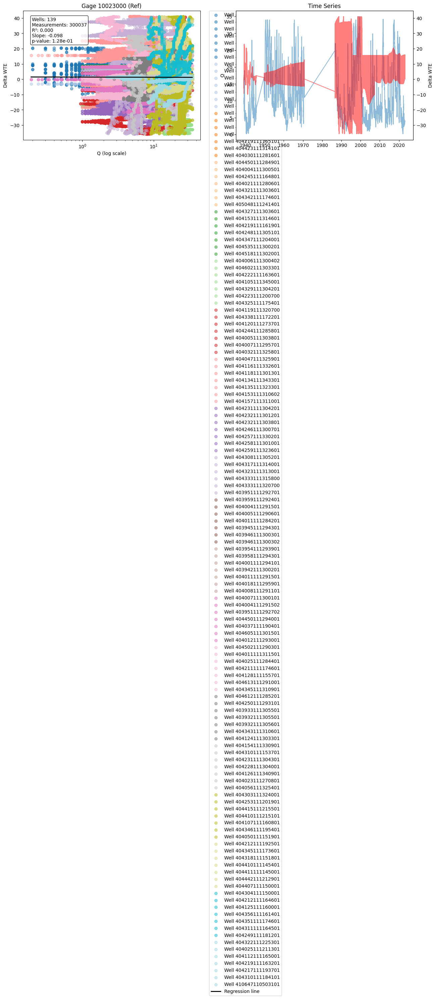

In [31]:
# Single station
file_path = '/content/paired_data/paired_gage_10023000.csv'
analyze_single_gage(file_path, remove_outliers=True)

Analyzing: /content/paired_data/paired_gage_10171000.csv


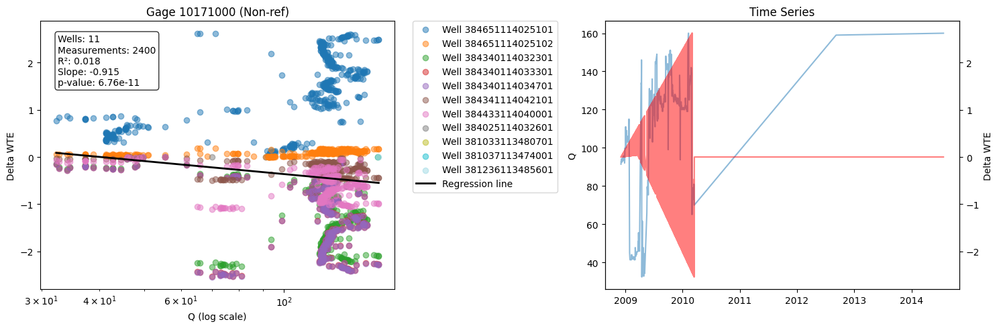


Analysis Results:
Number of wells: 11
Total measurements: 2498
Measurements after cleaning: 2400
Outliers removed: 98
- Q outliers: 98
- WTE outliers: 0

Regression statistics:
R²: 0.018
Slope: -0.915
p-value: 6.76e-11
Analyzing: /content/paired_data/paired_gage_10109001.csv


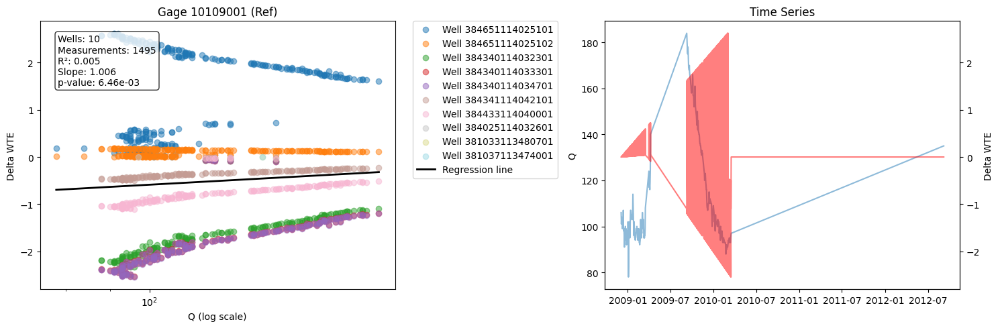


Analysis Results:
Number of wells: 10
Total measurements: 1509
Measurements after cleaning: 1495
Outliers removed: 14
- Q outliers: 14
- WTE outliers: 0

Regression statistics:
R²: 0.005
Slope: 1.006
p-value: 6.46e-03
Analyzing: /content/paired_data/paired_gage_10026500.csv


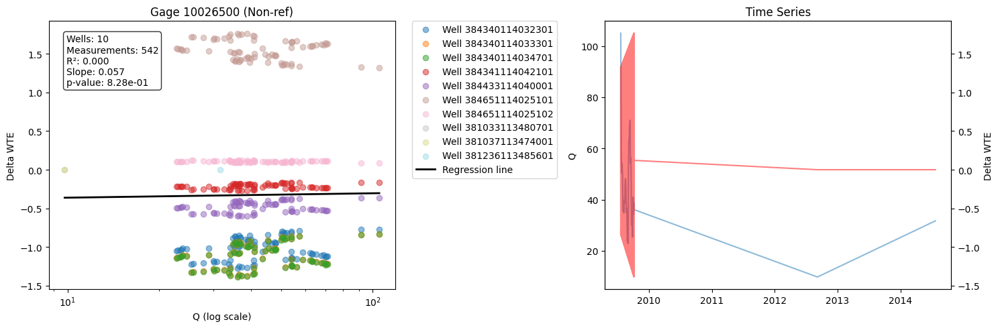


Analysis Results:
Number of wells: 10
Total measurements: 549
Measurements after cleaning: 542
Outliers removed: 7
- Q outliers: 7
- WTE outliers: 0

Regression statistics:
R²: 0.000
Slope: 0.057
p-value: 8.28e-01
Analyzing: /content/paired_data/paired_gage_10130500.csv


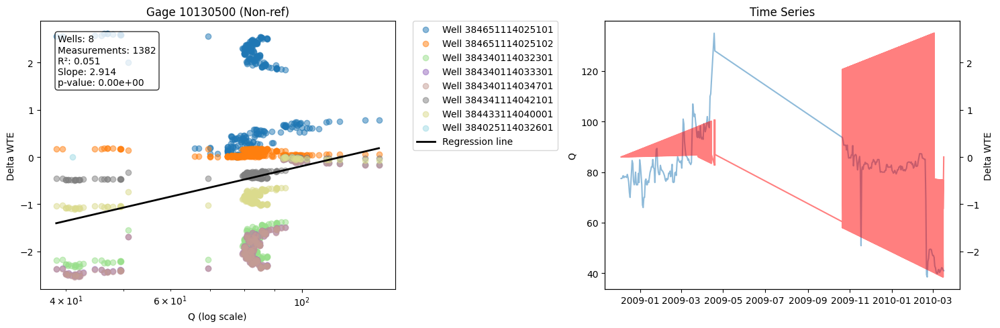


Analysis Results:
Number of wells: 8
Total measurements: 1774
Measurements after cleaning: 1382
Outliers removed: 392
- Q outliers: 392
- WTE outliers: 0

Regression statistics:
R²: 0.051
Slope: 2.914
p-value: 0.00e+00
Analyzing: /content/paired_data/paired_gage_10128500.csv


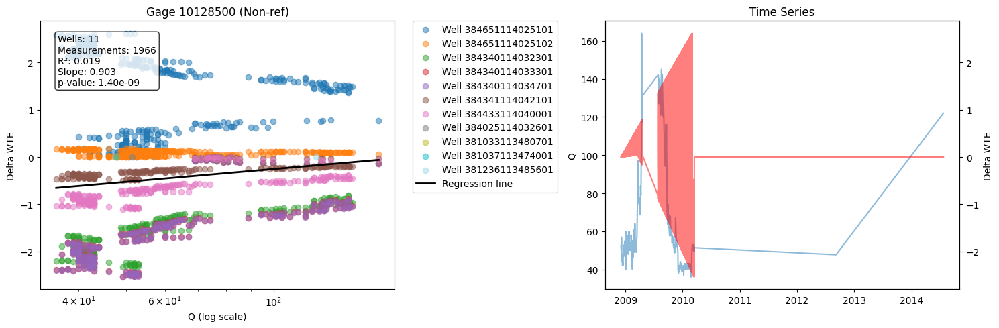


Analysis Results:
Number of wells: 11
Total measurements: 1966
Measurements after cleaning: 1966
Outliers removed: 0
- Q outliers: 0
- WTE outliers: 0

Regression statistics:
R²: 0.019
Slope: 0.903
p-value: 1.40e-09
Analyzing: /content/paired_data/paired_gage_10092700.csv


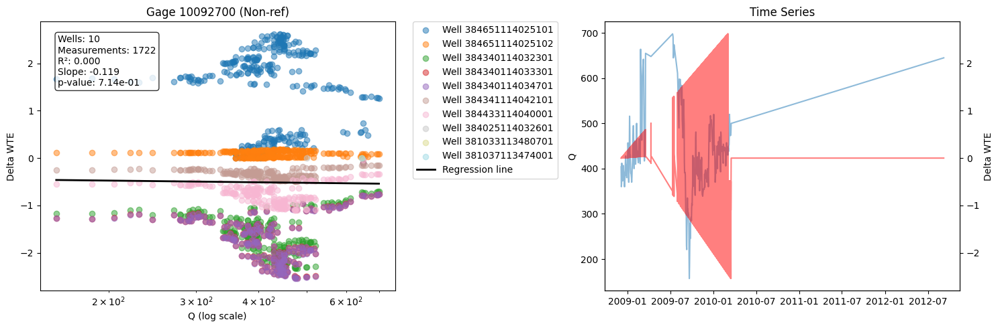


Analysis Results:
Number of wells: 10
Total measurements: 1729
Measurements after cleaning: 1722
Outliers removed: 7
- Q outliers: 7
- WTE outliers: 0

Regression statistics:
R²: 0.000
Slope: -0.119
p-value: 7.14e-01
Analyzing: /content/paired_data/paired_gage_10023000.csv


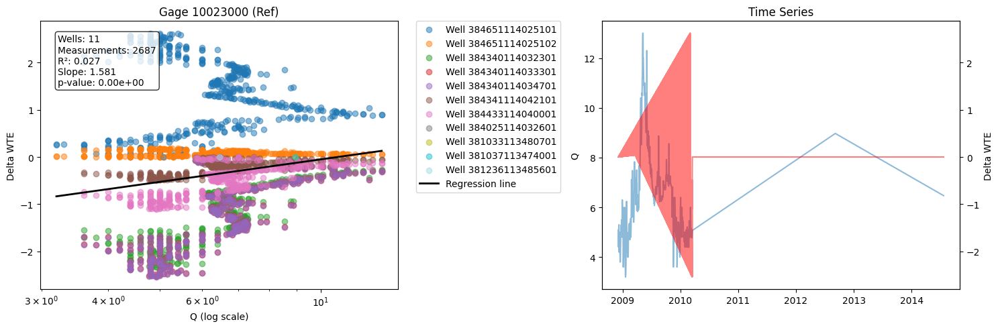


Analysis Results:
Number of wells: 11
Total measurements: 2694
Measurements after cleaning: 2687
Outliers removed: 7
- Q outliers: 7
- WTE outliers: 0

Regression statistics:
R²: 0.027
Slope: 1.581
p-value: 0.00e+00
Analyzing: /content/paired_data/paired_gage_10113500.csv
Skipping 10113500 - no valid Q values for log transformation
Analyzing: /content/paired_data/paired_gage_10172700.csv


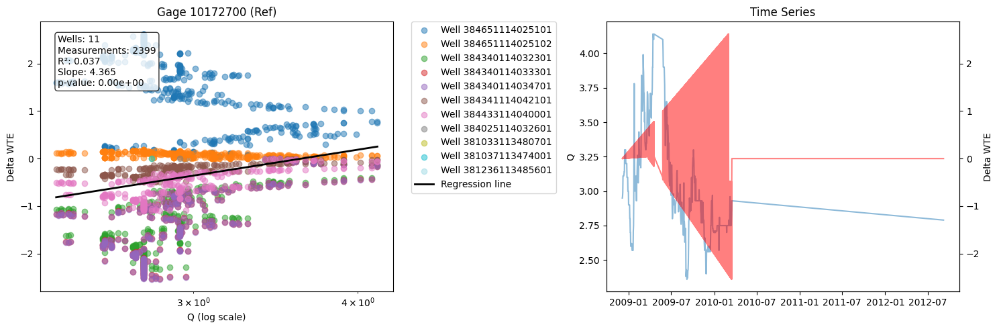


Analysis Results:
Number of wells: 11
Total measurements: 2463
Measurements after cleaning: 2399
Outliers removed: 64
- Q outliers: 64
- WTE outliers: 0

Regression statistics:
R²: 0.037
Slope: 4.365
p-value: 0.00e+00
Analyzing: /content/paired_data/paired_gage_10150500.csv


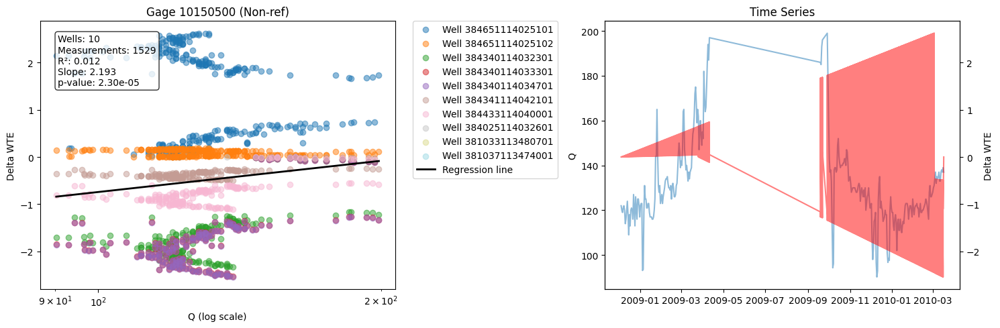


Analysis Results:
Number of wells: 10
Total measurements: 1643
Measurements after cleaning: 1529
Outliers removed: 114
- Q outliers: 114
- WTE outliers: 0

Regression statistics:
R²: 0.012
Slope: 2.193
p-value: 2.30e-05
Analyzing: /content/paired_data/paired_gage_10140100.csv


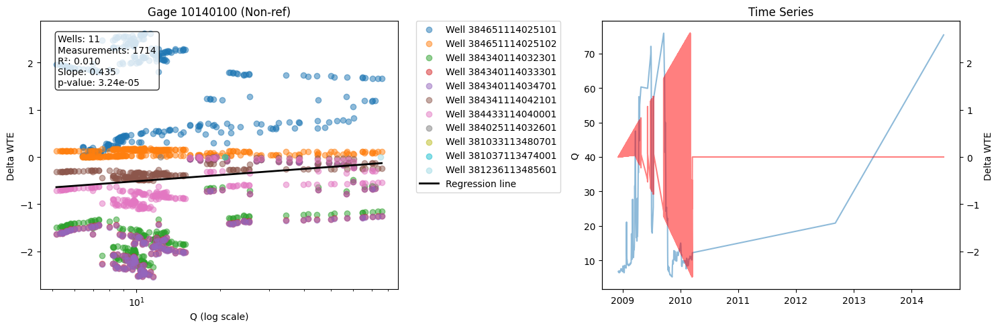


Analysis Results:
Number of wells: 11
Total measurements: 1966
Measurements after cleaning: 1714
Outliers removed: 252
- Q outliers: 252
- WTE outliers: 0

Regression statistics:
R²: 0.010
Slope: 0.435
p-value: 3.24e-05
Analyzing: /content/paired_data/paired_gage_10011500.csv


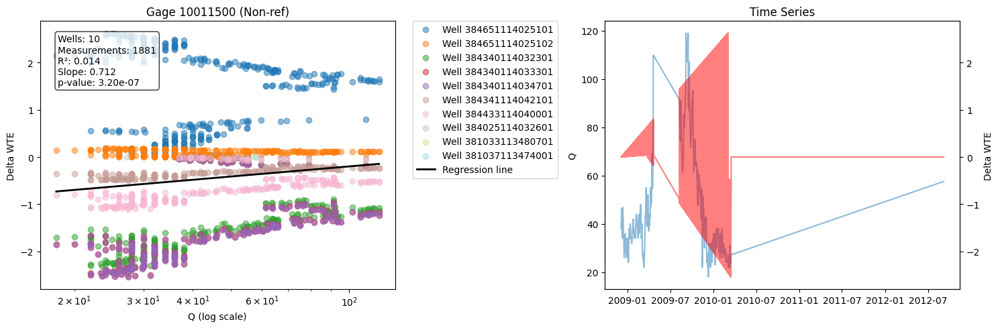


Analysis Results:
Number of wells: 10
Total measurements: 1881
Measurements after cleaning: 1881
Outliers removed: 0
- Q outliers: 0
- WTE outliers: 0

Regression statistics:
R²: 0.014
Slope: 0.712
p-value: 3.20e-07
Analyzing: /content/paired_data/paired_gage_10132500.csv


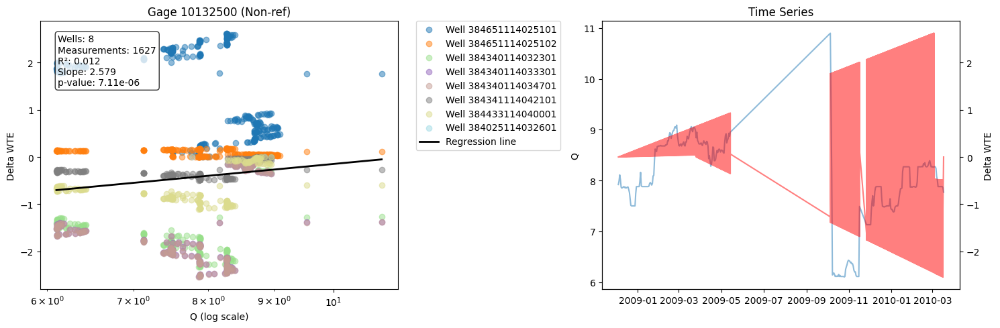


Analysis Results:
Number of wells: 8
Total measurements: 1662
Measurements after cleaning: 1627
Outliers removed: 35
- Q outliers: 35
- WTE outliers: 0

Regression statistics:
R²: 0.012
Slope: 2.579
p-value: 7.11e-06
Analyzing: /content/paired_data/paired_gage_10105900.csv


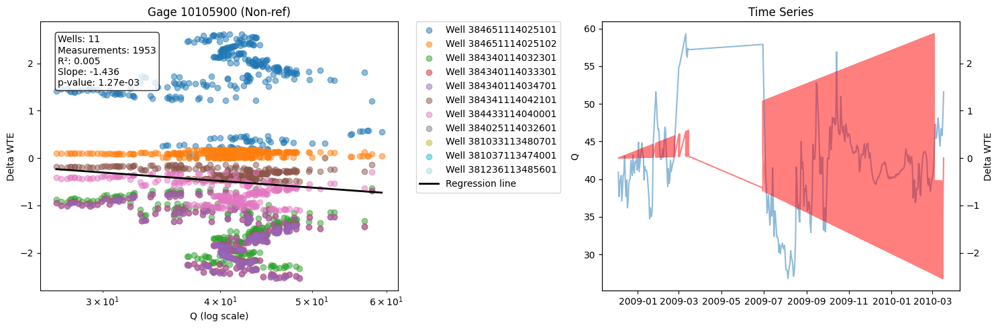


Analysis Results:
Number of wells: 11
Total measurements: 1975
Measurements after cleaning: 1953
Outliers removed: 22
- Q outliers: 22
- WTE outliers: 0

Regression statistics:
R²: 0.005
Slope: -1.436
p-value: 1.27e-03
Analyzing: /content/paired_data/paired_gage_10168000.csv


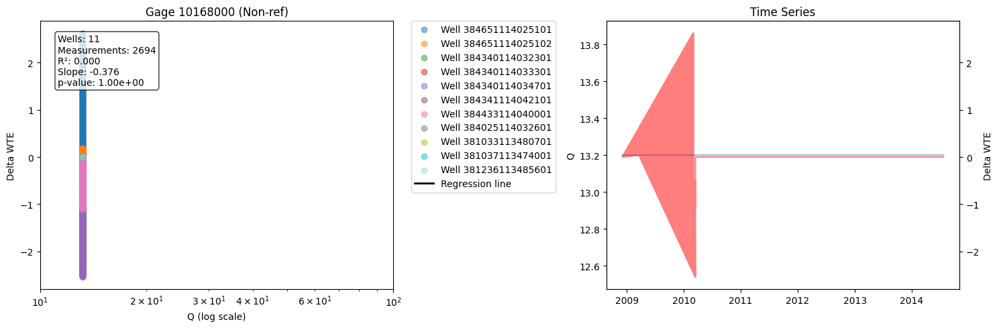


Analysis Results:
Number of wells: 11
Total measurements: 2694
Measurements after cleaning: 2694
Outliers removed: 0
- Q outliers: 0
- WTE outliers: 0

Regression statistics:
R²: 0.000
Slope: -0.376
p-value: 1.00e+00
Analyzing: /content/paired_data/paired_gage_10155200.csv


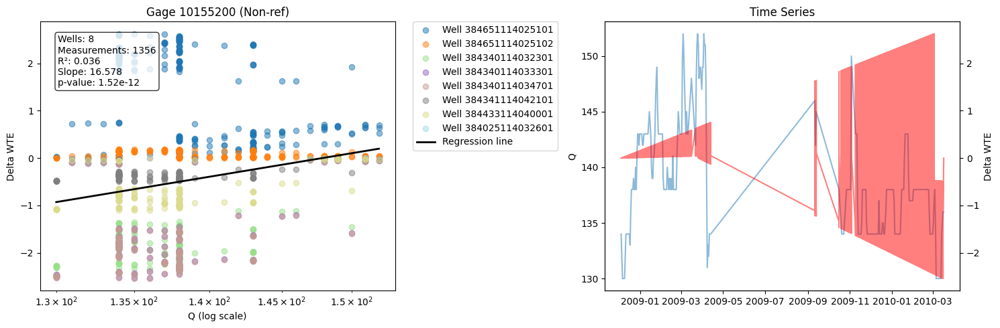


Analysis Results:
Number of wells: 8
Total measurements: 1433
Measurements after cleaning: 1356
Outliers removed: 77
- Q outliers: 77
- WTE outliers: 0

Regression statistics:
R²: 0.036
Slope: 16.578
p-value: 1.52e-12
Analyzing: /content/paired_data/paired_gage_10039500.csv


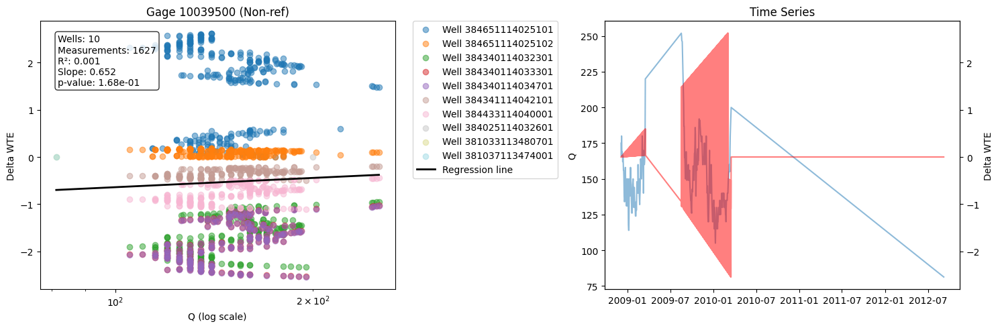


Analysis Results:
Number of wells: 10
Total measurements: 1627
Measurements after cleaning: 1627
Outliers removed: 0
- Q outliers: 0
- WTE outliers: 0

Regression statistics:
R²: 0.001
Slope: 0.652
p-value: 1.68e-01
Analyzing: /content/paired_data/paired_gage_10155500.csv


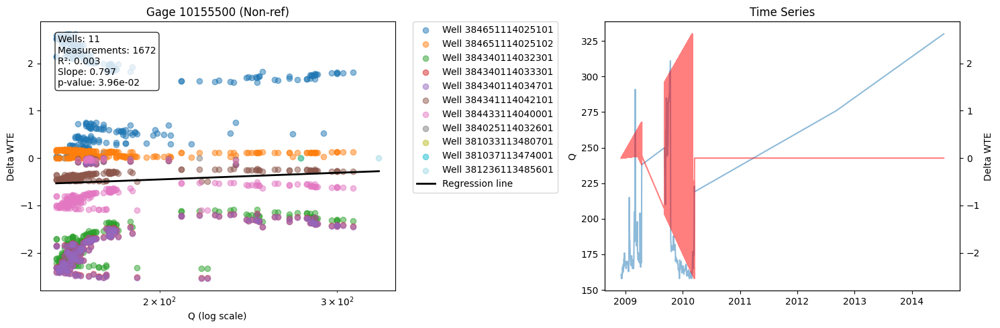


Analysis Results:
Number of wells: 11
Total measurements: 1847
Measurements after cleaning: 1672
Outliers removed: 175
- Q outliers: 175
- WTE outliers: 0

Regression statistics:
R²: 0.003
Slope: 0.797
p-value: 3.96e-02
Analyzing: /content/paired_data/paired_gage_10153100.csv


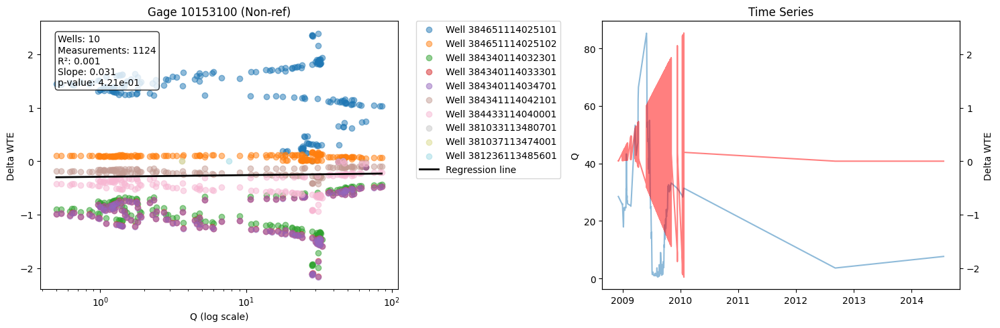


Analysis Results:
Number of wells: 10
Total measurements: 1131
Measurements after cleaning: 1124
Outliers removed: 7
- Q outliers: 7
- WTE outliers: 0

Regression statistics:
R²: 0.001
Slope: 0.031
p-value: 4.21e-01
Analyzing: /content/paired_data/paired_gage_10164500.csv


<ipython-input-60-32cfb3db0fc6>:69: RuntimeWarning: invalid value encountered in scalar divide
  mse = np.sum((y - model.predict(X))**2) / (n-2)


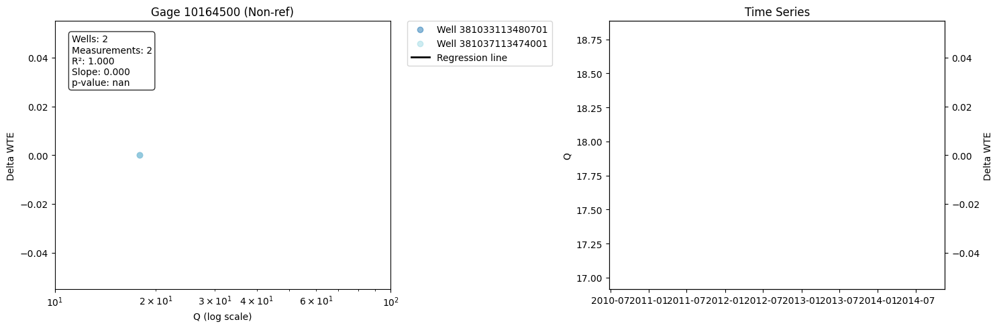


Analysis Results:
Number of wells: 2
Total measurements: 2
Measurements after cleaning: 2
Outliers removed: 0
- Q outliers: 0
- WTE outliers: 0

Regression statistics:
R²: 1.000
Slope: 0.000
p-value: nan
Analyzing: /content/paired_data/paired_gage_10129500.csv


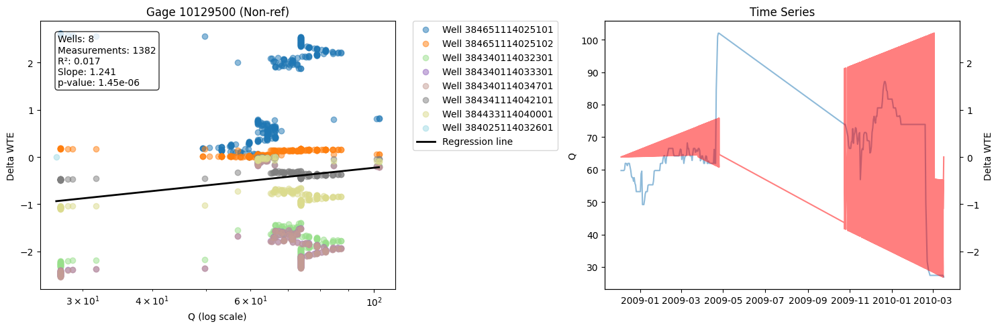


Analysis Results:
Number of wells: 8
Total measurements: 1424
Measurements after cleaning: 1382
Outliers removed: 42
- Q outliers: 42
- WTE outliers: 0

Regression statistics:
R²: 0.017
Slope: 1.241
p-value: 1.45e-06
Analyzing: /content/paired_data/paired_gage_10155000.csv


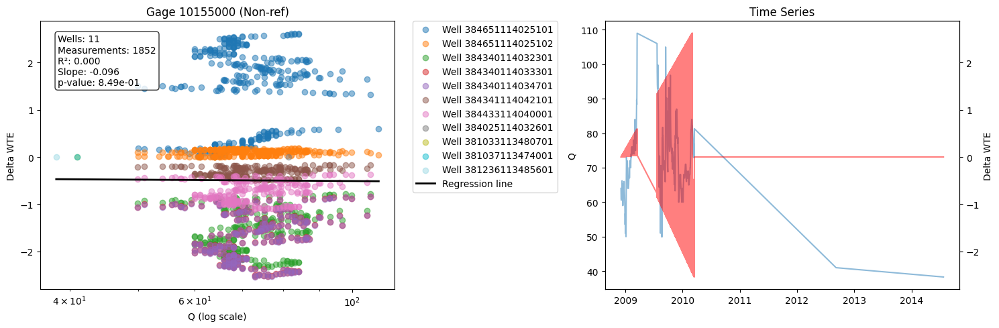


Analysis Results:
Number of wells: 11
Total measurements: 1852
Measurements after cleaning: 1852
Outliers removed: 0
- Q outliers: 0
- WTE outliers: 0

Regression statistics:
R²: 0.000
Slope: -0.096
p-value: 8.49e-01
Analyzing: /content/paired_data/paired_gage_10134500.csv


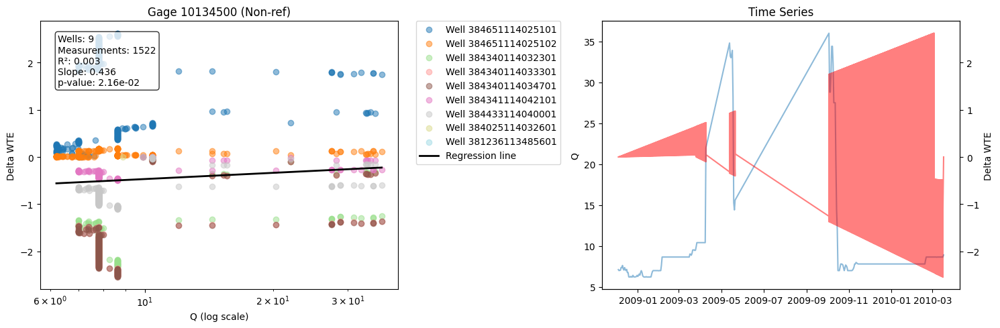


Analysis Results:
Number of wells: 9
Total measurements: 1845
Measurements after cleaning: 1522
Outliers removed: 323
- Q outliers: 323
- WTE outliers: 0

Regression statistics:
R²: 0.003
Slope: 0.436
p-value: 2.16e-02
Analyzing: /content/paired_data/paired_gage_10038000.csv


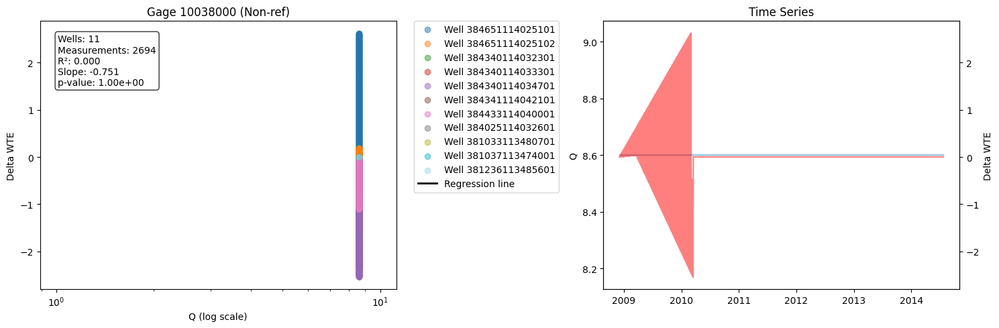


Analysis Results:
Number of wells: 11
Total measurements: 2694
Measurements after cleaning: 2694
Outliers removed: 0
- Q outliers: 0
- WTE outliers: 0

Regression statistics:
R²: 0.000
Slope: -0.751
p-value: 1.00e+00
Analyzing: /content/paired_data/paired_gage_10172860.csv


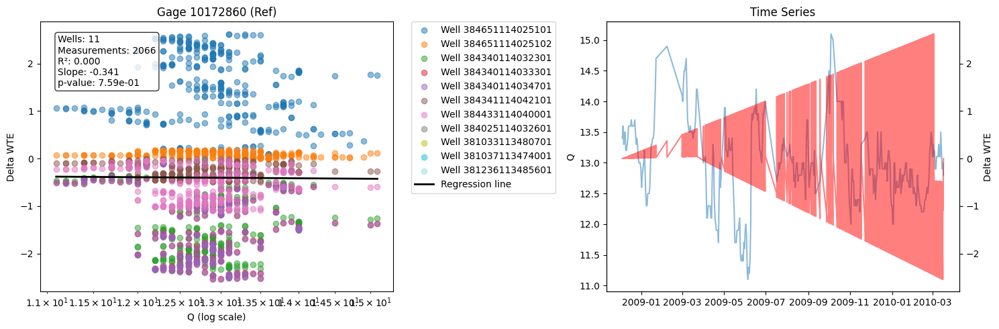


Analysis Results:
Number of wells: 11
Total measurements: 2069
Measurements after cleaning: 2066
Outliers removed: 3
- Q outliers: 3
- WTE outliers: 0

Regression statistics:
R²: 0.000
Slope: -0.341
p-value: 7.59e-01
Analyzing: /content/paired_data/paired_gage_10109000.csv


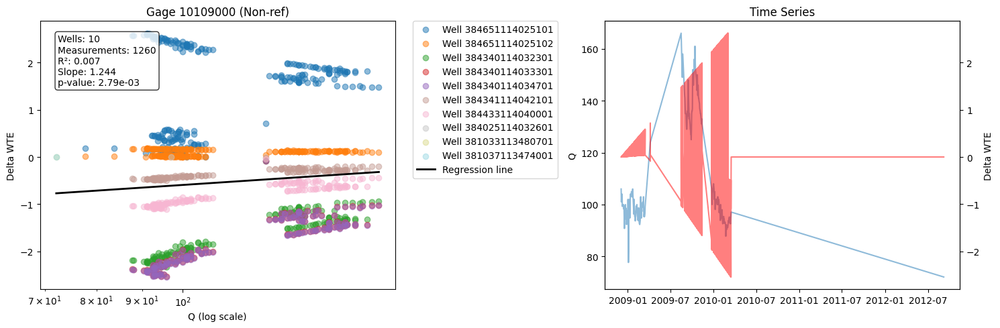


Analysis Results:
Number of wells: 10
Total measurements: 1260
Measurements after cleaning: 1260
Outliers removed: 0
- Q outliers: 0
- WTE outliers: 0

Regression statistics:
R²: 0.007
Slope: 1.244
p-value: 2.79e-03
Analyzing: /content/paired_data/paired_gage_10156000.csv


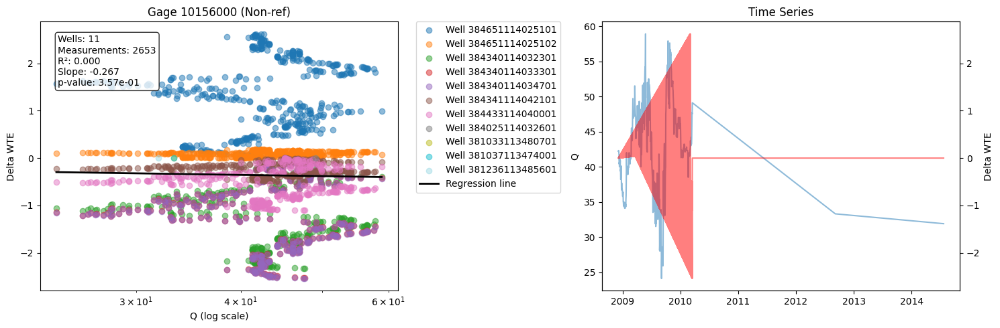


Analysis Results:
Number of wells: 11
Total measurements: 2653
Measurements after cleaning: 2653
Outliers removed: 0
- Q outliers: 0
- WTE outliers: 0

Regression statistics:
R²: 0.000
Slope: -0.267
p-value: 3.57e-01
Analyzing: /content/paired_data/paired_gage_10016900.csv


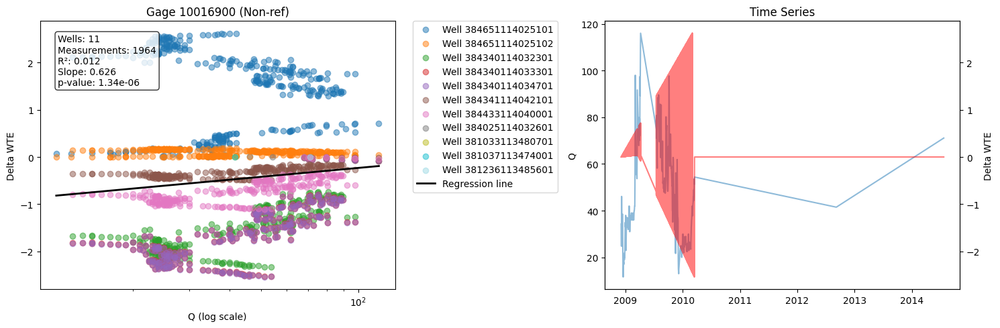


Analysis Results:
Number of wells: 11
Total measurements: 1964
Measurements after cleaning: 1964
Outliers removed: 0
- Q outliers: 0
- WTE outliers: 0

Regression statistics:
R²: 0.012
Slope: 0.626
p-value: 1.34e-06
Analyzing: /content/paired_data/paired_gage_10163000.csv


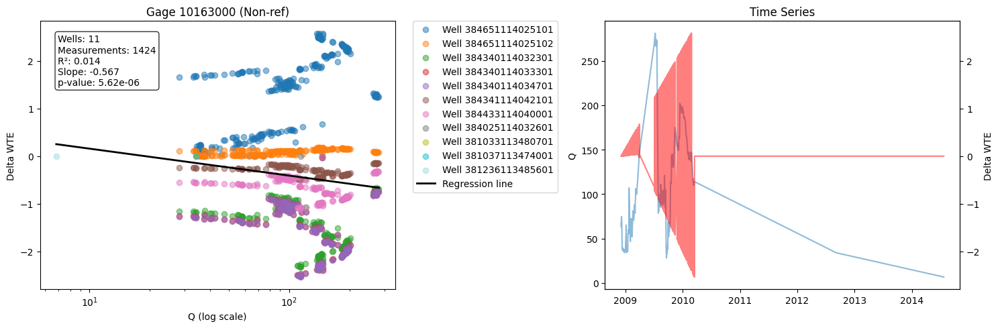


Analysis Results:
Number of wells: 11
Total measurements: 1424
Measurements after cleaning: 1424
Outliers removed: 0
- Q outliers: 0
- WTE outliers: 0

Regression statistics:
R²: 0.014
Slope: -0.567
p-value: 5.62e-06
Analyzing: /content/paired_data/paired_gage_10020300.csv


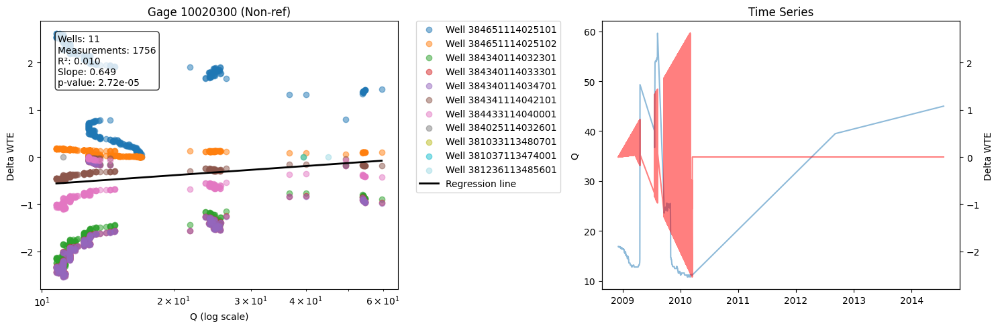


Analysis Results:
Number of wells: 11
Total measurements: 1903
Measurements after cleaning: 1756
Outliers removed: 147
- Q outliers: 147
- WTE outliers: 0

Regression statistics:
R²: 0.010
Slope: 0.649
p-value: 2.72e-05
Analyzing: /content/paired_data/paired_gage_10132000.csv


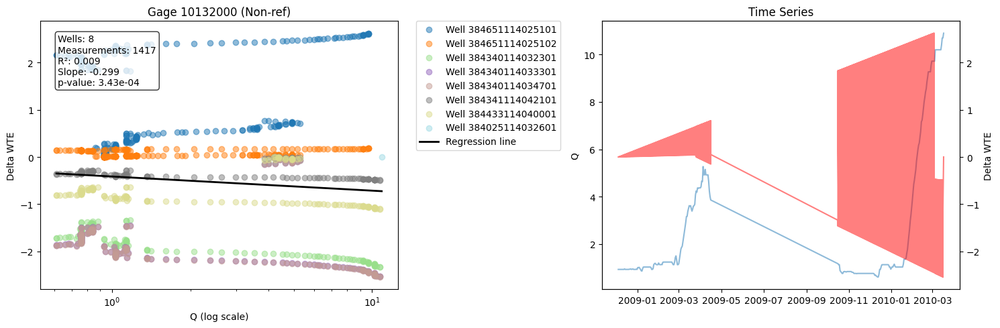


Analysis Results:
Number of wells: 8
Total measurements: 1480
Measurements after cleaning: 1417
Outliers removed: 63
- Q outliers: 63
- WTE outliers: 0

Regression statistics:
R²: 0.009
Slope: -0.299
p-value: 3.43e-04
Analyzing: /content/paired_data/paired_gage_10142000.csv


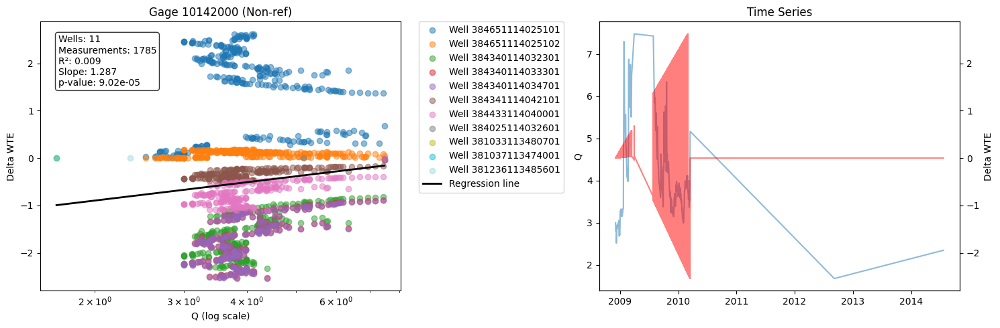


Analysis Results:
Number of wells: 11
Total measurements: 1896
Measurements after cleaning: 1785
Outliers removed: 111
- Q outliers: 111
- WTE outliers: 0

Regression statistics:
R²: 0.009
Slope: 1.287
p-value: 9.02e-05
Analyzing: /content/paired_data/paired_gage_10068500.csv


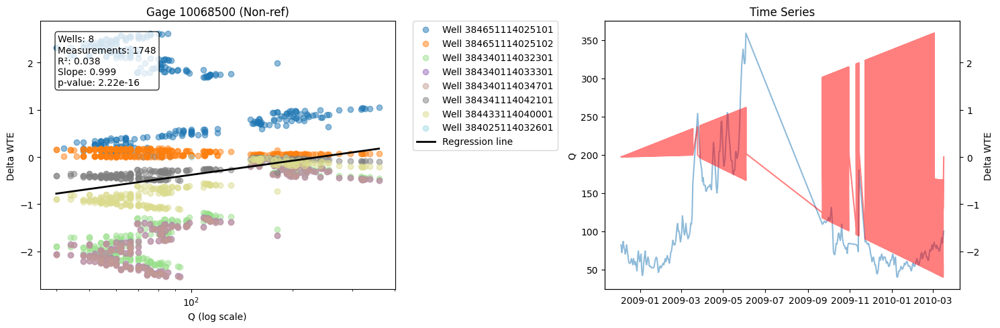


Analysis Results:
Number of wells: 8
Total measurements: 1755
Measurements after cleaning: 1748
Outliers removed: 7
- Q outliers: 7
- WTE outliers: 0

Regression statistics:
R²: 0.038
Slope: 0.999
p-value: 2.22e-16
Analyzing: /content/paired_data/paired_gage_10154200.csv


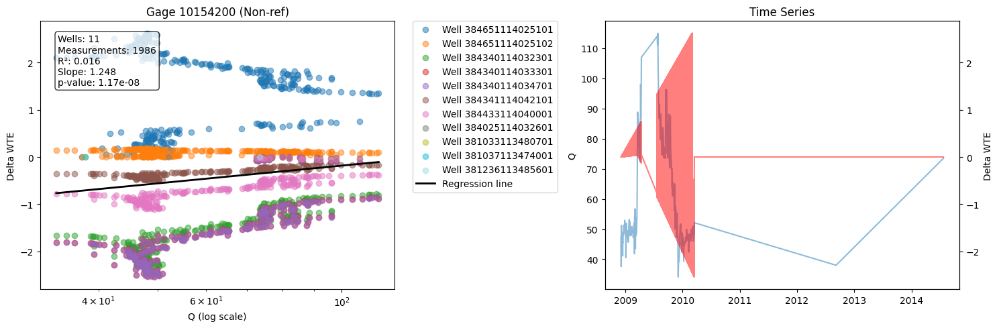


Analysis Results:
Number of wells: 11
Total measurements: 2000
Measurements after cleaning: 1986
Outliers removed: 14
- Q outliers: 14
- WTE outliers: 0

Regression statistics:
R²: 0.016
Slope: 1.248
p-value: 1.17e-08
Analyzing: /content/paired_data/paired_gage_10129900.csv


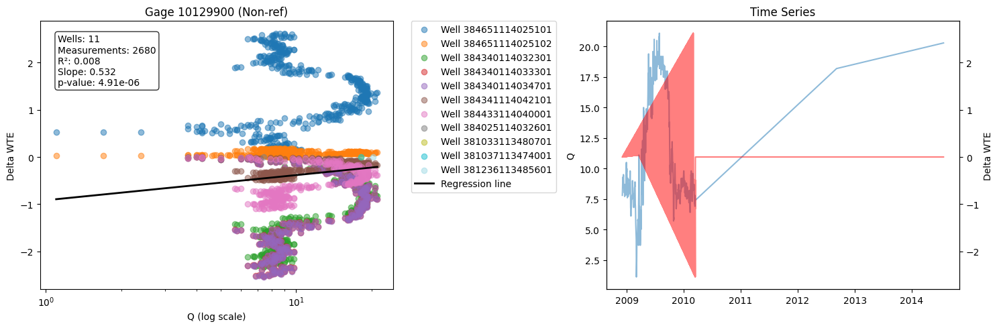


Analysis Results:
Number of wells: 11
Total measurements: 2680
Measurements after cleaning: 2680
Outliers removed: 0
- Q outliers: 0
- WTE outliers: 0

Regression statistics:
R²: 0.008
Slope: 0.532
p-value: 4.91e-06
Analyzing: /content/paired_data/paired_gage_10143500.csv


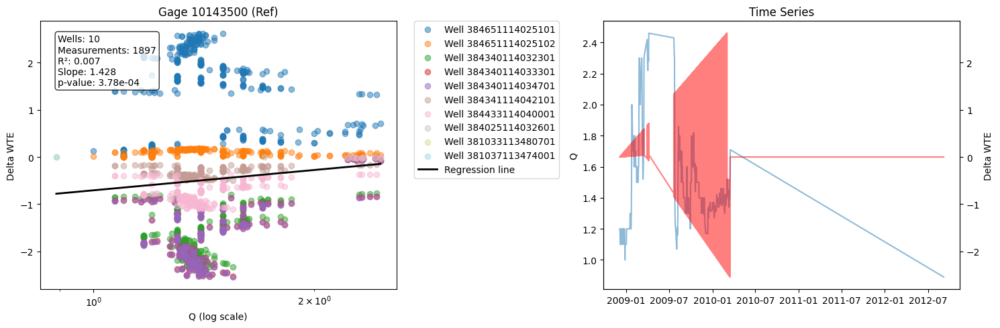


Analysis Results:
Number of wells: 10
Total measurements: 1990
Measurements after cleaning: 1897
Outliers removed: 93
- Q outliers: 93
- WTE outliers: 0

Regression statistics:
R²: 0.007
Slope: 1.428
p-value: 3.78e-04
Analyzing: /content/paired_data/paired_gage_10126000.csv


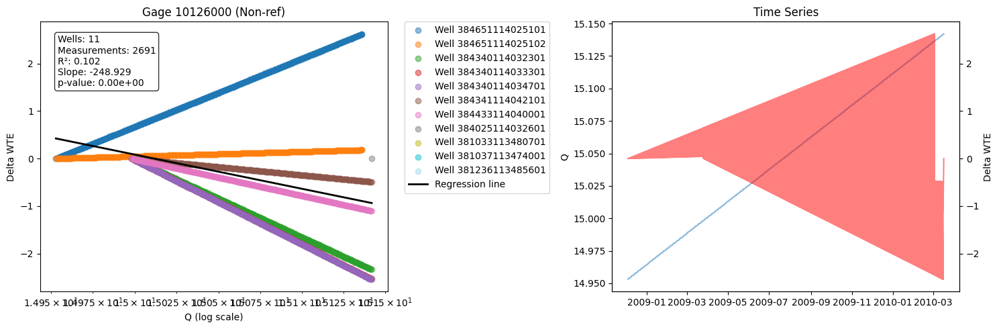


Analysis Results:
Number of wells: 11
Total measurements: 2694
Measurements after cleaning: 2691
Outliers removed: 3
- Q outliers: 3
- WTE outliers: 0

Regression statistics:
R²: 0.102
Slope: -248.929
p-value: 0.00e+00
Analyzing: /content/paired_data/paired_gage_10146400.csv


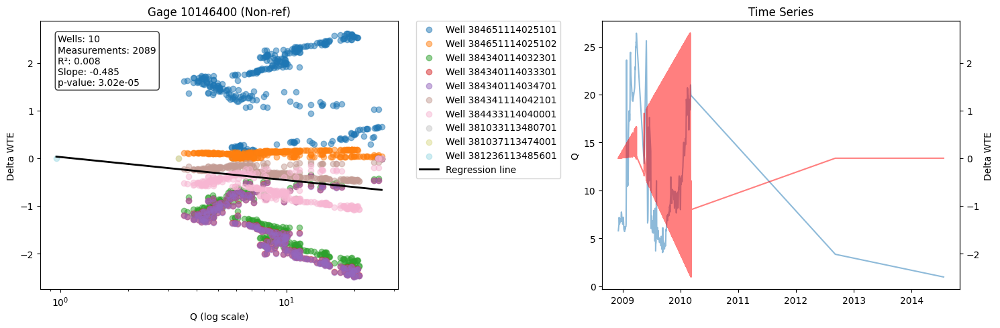


Analysis Results:
Number of wells: 10
Total measurements: 2089
Measurements after cleaning: 2089
Outliers removed: 0
- Q outliers: 0
- WTE outliers: 0

Regression statistics:
R²: 0.008
Slope: -0.485
p-value: 3.02e-05
Analyzing: /content/paired_data/paired_gage_10020100.csv


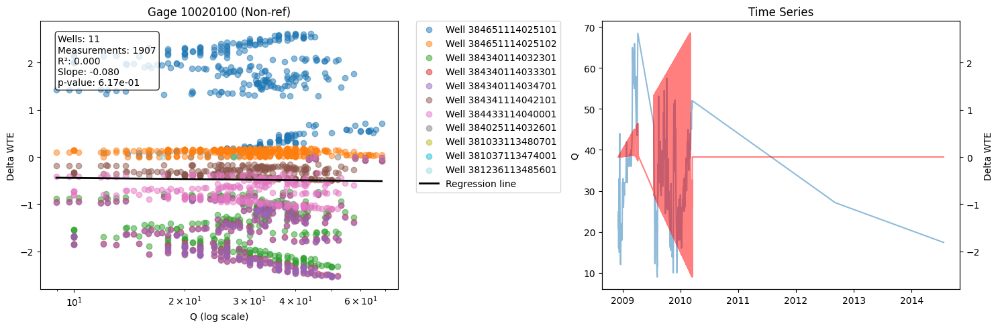


Analysis Results:
Number of wells: 11
Total measurements: 1913
Measurements after cleaning: 1907
Outliers removed: 6
- Q outliers: 6
- WTE outliers: 0

Regression statistics:
R²: 0.000
Slope: -0.080
p-value: 6.17e-01
Analyzing: /content/paired_data/paired_gage_10133800.csv


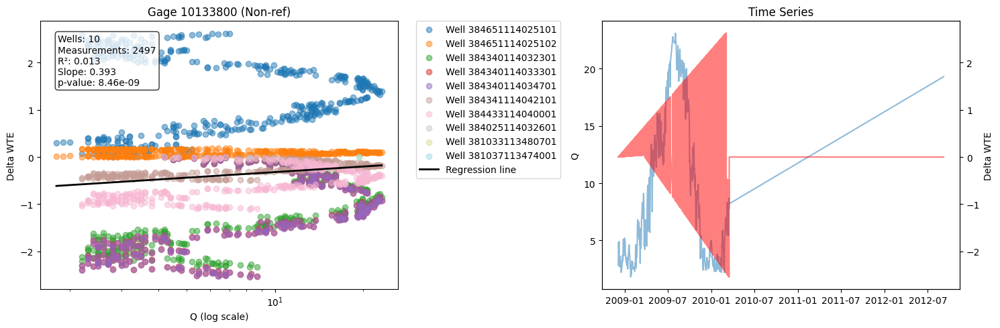


Analysis Results:
Number of wells: 10
Total measurements: 2497
Measurements after cleaning: 2497
Outliers removed: 0
- Q outliers: 0
- WTE outliers: 0

Regression statistics:
R²: 0.013
Slope: 0.393
p-value: 8.46e-09
Analyzing: /content/paired_data/paired_gage_10157500.csv


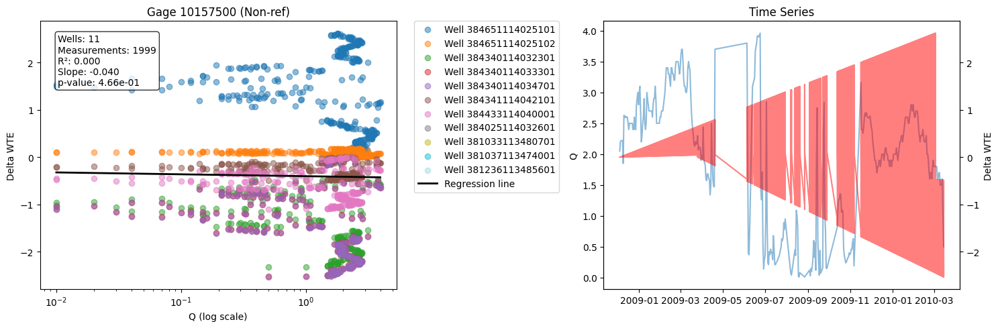


Analysis Results:
Number of wells: 11
Total measurements: 2344
Measurements after cleaning: 1999
Outliers removed: 0
- Q outliers: 0
- WTE outliers: 0

Regression statistics:
R²: 0.000
Slope: -0.040
p-value: 4.66e-01
Analyzing: /content/paired_data/paired_gage_10172952.csv


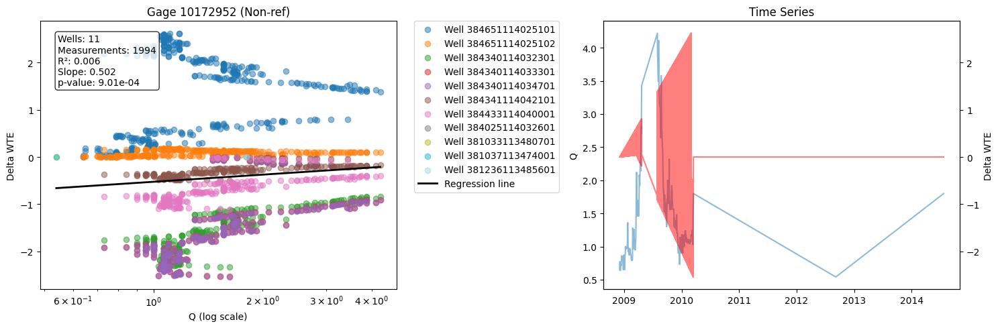


Analysis Results:
Number of wells: 11
Total measurements: 2099
Measurements after cleaning: 1994
Outliers removed: 105
- Q outliers: 105
- WTE outliers: 0

Regression statistics:
R²: 0.006
Slope: 0.502
p-value: 9.01e-04
Analyzing: /content/paired_data/paired_gage_10131000.csv


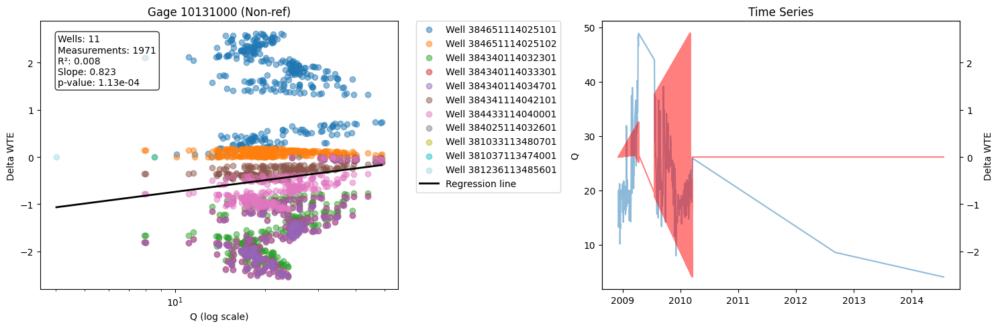


Analysis Results:
Number of wells: 11
Total measurements: 1985
Measurements after cleaning: 1971
Outliers removed: 14
- Q outliers: 14
- WTE outliers: 0

Regression statistics:
R²: 0.008
Slope: 0.823
p-value: 1.13e-04
Analyzing: /content/paired_data/paired_gage_10137500.csv


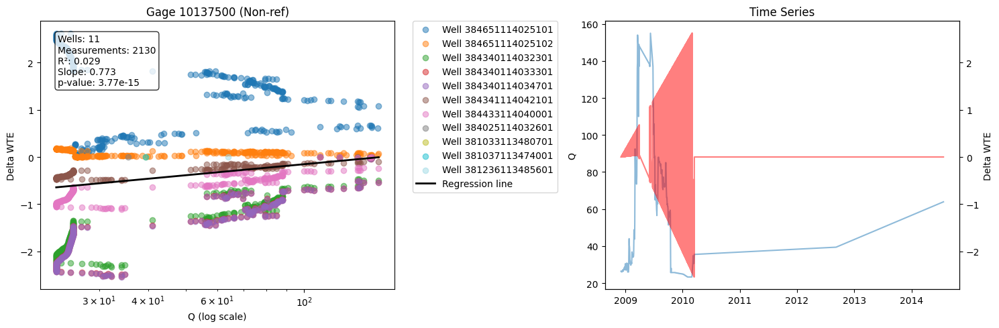


Analysis Results:
Number of wells: 11
Total measurements: 2130
Measurements after cleaning: 2130
Outliers removed: 0
- Q outliers: 0
- WTE outliers: 0

Regression statistics:
R²: 0.029
Slope: 0.773
p-value: 3.77e-15
Analyzing: /content/paired_data/paired_gage_10133600.csv


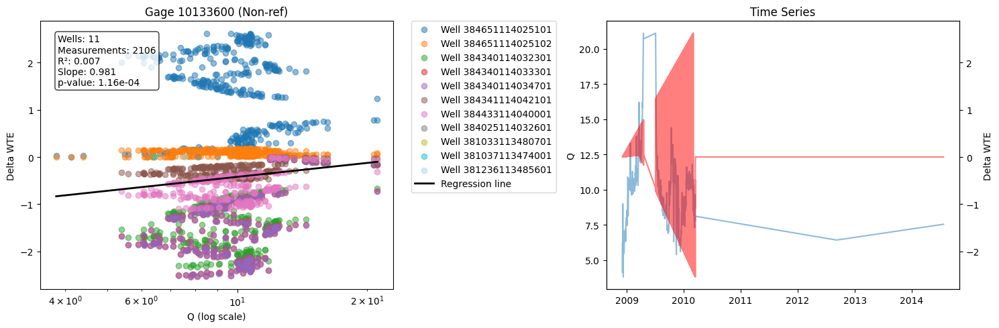


Analysis Results:
Number of wells: 11
Total measurements: 2267
Measurements after cleaning: 2106
Outliers removed: 161
- Q outliers: 161
- WTE outliers: 0

Regression statistics:
R²: 0.007
Slope: 0.981
p-value: 1.16e-04
Analyzing: /content/paired_data/paired_gage_10146000.csv


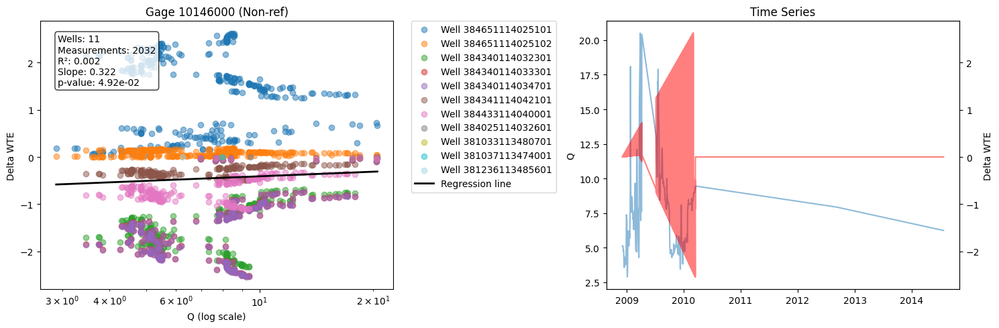


Analysis Results:
Number of wells: 11
Total measurements: 2104
Measurements after cleaning: 2032
Outliers removed: 72
- Q outliers: 72
- WTE outliers: 0

Regression statistics:
R²: 0.002
Slope: 0.322
p-value: 4.92e-02


In [ ]:
import glob

# Assuming 'paired_data_dir' is defined as in the provided code
paired_data_dir = '/content/paired_data/'

# Use glob to find all matching CSV files
csv_files = glob.glob(os.path.join(paired_data_dir, 'paired_gage_*.csv'))

# Loop through each file and run the analysis
for file_path in csv_files:
    print(f"Analyzing: {file_path}")
    analyze_single_gage(file_path, remove_outliers=True)

# 4.Analyze by class

Found 70 gage files

Performing class-level analysis...
Error processing 10168000: Input y contains NaN.
Error processing 10015700: Input y contains NaN.
Error processing 10168500: Input y contains NaN.
Error processing 10011500: Input y contains NaN.
Error processing 10164500: Input y contains NaN.
Error processing 10109001: Input y contains NaN.
Error processing 10046500: Input y contains NaN.
Error processing 10172952: Input y contains NaN.
Error processing 10128500: Input y contains NaN.
Error processing 10153800: Input y contains NaN.
Error processing 10154200: Input y contains NaN.
Error processing 10104900: Input y contains NaN.

Statistical Comparison by Class:
            n_wells               r_squared       slope       
               mean     std count      mean  std   mean    std
gage_class                                                    
Non-ref     112.846  49.331    52       0.0  0.0  0.041  2.429
Ref         103.167  59.456     6       0.0  0.0 -2.035  6.331


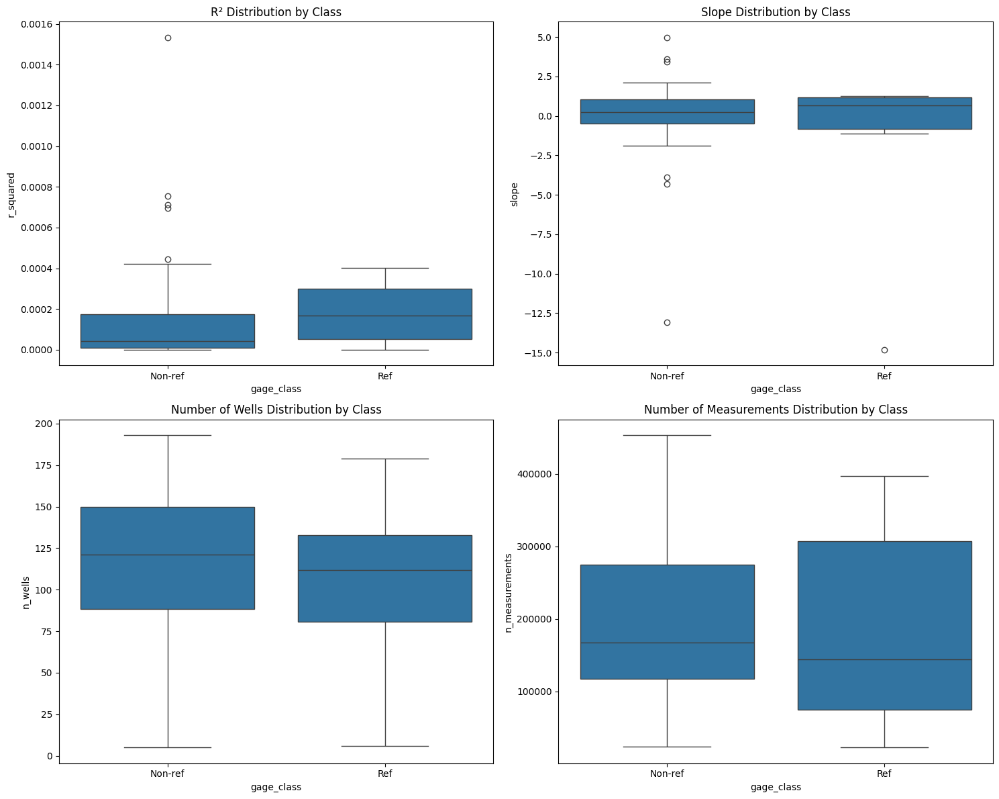


Performing advanced class analysis...

Mann-Whitney U test for r_squared:
p-value: 3.473e-01

Mann-Whitney U test for slope:
p-value: 9.108e-01


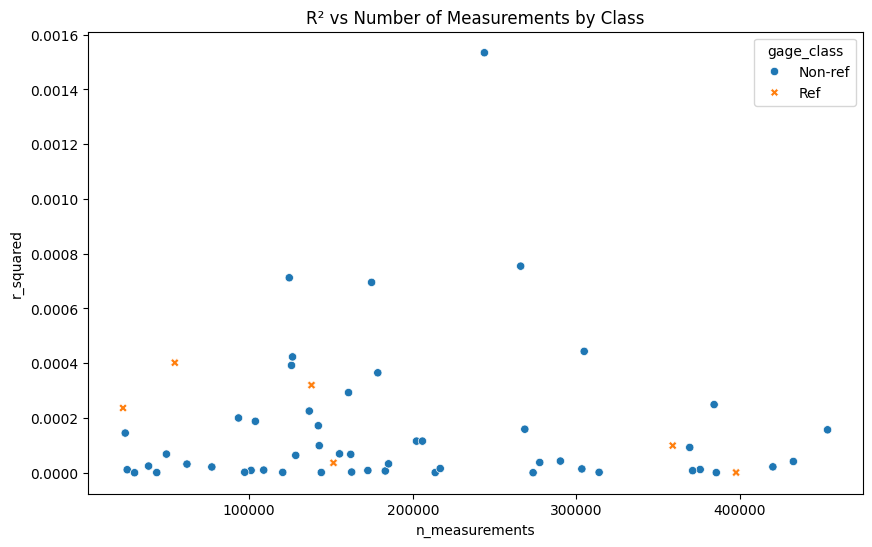

In [33]:
import glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from sklearn.linear_model import LinearRegression
def analyze_by_class(paired_data_dir):
    """
    Analyze Q-WTE relationships grouped by gage class

    Args:
        paired_data_dir (str): Directory containing paired CSV files
    """
    # Collect results for each gage
    gage_results = []

    # Process each gage file
    for file in glob.glob(f'{paired_data_dir}/paired_gage_*.csv'):
        df = pd.read_csv(file)
        gage_id = df['gage_id'].iloc[0]
        gage_class = df['gage_class'].iloc[0]

        # Remove zero or negative Q values for log transformation
        df = df[df['Q'] > 0]

        # Skip if no valid data after filtering
        if len(df) == 0:
            print(f"Skipping {gage_id} - no valid Q values")
            continue

        try:
            # Calculate metrics for each gage
            X = np.log10(df['Q']).values.reshape(-1, 1)
            y = df['delta_wte'].values
            model = LinearRegression()
            model.fit(X, y)

            gage_stats = {
                'gage_id': gage_id,
                'gage_class': gage_class,
                'n_wells': df['well_id'].nunique(),
                'n_measurements': len(df),
                'r_squared': model.score(X, y),
                'slope': model.coef_[0],
                'q_mean': df['Q'].mean(),
                'q_std': df['Q'].std(),
                'delta_wte_mean': df['delta_wte'].mean(),
                'delta_wte_std': df['delta_wte'].std()
            }
            gage_results.append(gage_stats)

        except Exception as e:
            print(f"Error processing {gage_id}: {str(e)}")
            continue

    # Convert to DataFrame
    results_df = pd.DataFrame(gage_results)

    if len(results_df) == 0:
        print("No valid results to analyze")
        return None

    # Statistical comparison between classes
    print("\nStatistical Comparison by Class:")
    class_comparison = results_df.groupby('gage_class').agg({
        'n_wells': ['mean', 'std', 'count'],
        'r_squared': ['mean', 'std'],
        'slope': ['mean', 'std']
    }).round(3)
    print(class_comparison)

    # Visualization
    fig, axes = plt.subplots(2, 2, figsize=(15, 12))

    # R-squared distribution
    sns.boxplot(data=results_df, x='gage_class', y='r_squared', ax=axes[0,0])
    axes[0,0].set_title('R² Distribution by Class')

    # Slope distribution
    sns.boxplot(data=results_df, x='gage_class', y='slope', ax=axes[0,1])
    axes[0,1].set_title('Slope Distribution by Class')

    # Number of wells distribution
    sns.boxplot(data=results_df, x='gage_class', y='n_wells', ax=axes[1,0])
    axes[1,0].set_title('Number of Wells Distribution by Class')

    # Measurements distribution
    sns.boxplot(data=results_df, x='gage_class', y='n_measurements', ax=axes[1,1])
    axes[1,1].set_title('Number of Measurements Distribution by Class')

    plt.tight_layout()
    plt.show()

    return results_df

def advanced_class_analysis(results_df):
    """
    Perform advanced analysis on class differences
    """
    if results_df is None or len(results_df) == 0:
        print("No data to analyze")
        return

    # Statistical tests
    for metric in ['r_squared', 'slope']:
        ref_data = results_df[results_df['gage_class'] == 'Ref'][metric]
        nonref_data = results_df[results_df['gage_class'] == 'Non-ref'][metric]

        if len(ref_data) == 0 or len(nonref_data) == 0:
            print(f"Not enough data for {metric} comparison")
            continue

        # Mann-Whitney U test
        stat, p_value = stats.mannwhitneyu(ref_data, nonref_data)
        print(f"\nMann-Whitney U test for {metric}:")
        print(f"p-value: {p_value:.3e}")

    # Relationship patterns
    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=results_df, x='n_measurements', y='r_squared',
                   hue='gage_class', style='gage_class')
    plt.title('R² vs Number of Measurements by Class')
    plt.show()

# Main workflow
def main_class_analysis():
    """
    Main workflow for analyzing Q-WTE relationships by gage class
    """
    paired_data_dir = '/content/paired_data'
    all_gage_files = glob.glob(f'{paired_data_dir}/paired_gage_*.csv')

    print(f"Found {len(all_gage_files)} gage files")

    # Run class-level analysis
    print("\nPerforming class-level analysis...")
    results_df = analyze_by_class(paired_data_dir)

    if results_df is not None and len(results_df) > 0:
        # Run advanced class analysis
        print("\nPerforming advanced class analysis...")
        advanced_class_analysis(results_df)

    return results_df

# Run the analysis
results = main_class_analysis()